<a href="https://colab.research.google.com/github/Olivier-Gauvin/LockonStrat/blob/main/dog_breed_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!unzip "drive/MyDrive/Colab Notebooks/dog-breed-identification.zip"

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: train/83fad0718581a696132c96c166472627.jpg  
  inflating: train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: train/840dbad5a691c22611d85b2488bf4cbb.jpg  
  inflating: train/8410ced9ebc1759a7ebce5c42bfb5222.

# Importing modules

In [2]:
import pandas as pd
import numpy as np
import matplotlib .pyplot as plt
import os
import datetime
import tensorflow as tf
import tensorflow_hub as hub
from sklearn.model_selection import train_test_split
print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not available")

TF version: 2.15.0
Hub version: 0.15.0
GPU Available


# Checking files

In [3]:
#%%
label_csv = pd.read_csv("labels.csv")
print( label_csv.describe())
print(label_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
label_csv['breed'].value_counts().sort_values(ascending=False)


scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

In [5]:
min_count = label_csv['breed'].value_counts().min()
median_count = label_csv['breed'].value_counts().median()
max_count = label_csv['breed'].value_counts().max()

print(f"The lowest amount of example for certain breed is: {min_count}")
print(f"The median number of examples per breed is:{median_count}")
print(f"The largest amount of example for certain breed is: {max_count}")

The lowest amount of example for certain breed is: 66
The median number of examples per breed is:82.0
The largest amount of example for certain breed is: 126


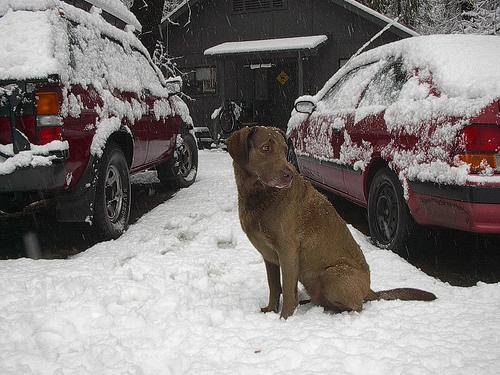

In [6]:
from IPython.display import Image
Image('train/fff43b07992508bc822f33d8ffd902ae.jpg')

In [7]:
filepath = "train/"
filename = [filepath+fname+'.jpg' for fname in label_csv.id]
print(f"There are:{len(filename)} names in the CSV file")

There are:10222 names in the CSV file


In [8]:
if len(os.listdir(filepath)) == len(filename):
    print("Filename length match the amount of pictures")
else:
    print("Filename length does not match the amount of pictures")


Filename length match the amount of pictures


In [9]:
labels = label_csv['breed'].to_numpy()
len(labels)

10222

In [10]:
breeds = np.unique(labels)
len(breeds)

120

In [11]:
boolean_labels = [label == breeds for label in labels]
len(boolean_labels)

10222

In [12]:
X = filename
y = boolean_labels

In [13]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:100}

In [14]:
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

#Turning images in Tensors

In [15]:
IMG_SIZE = 224

In [88]:

def process_image(image_path, img_size=IMG_SIZE):
    """
    Function to preprocess the image and convert it into a tensor.
    """
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [img_size, img_size])
    image = image / 255.0  # Normalize pixel values
    return image


def get_image_label(image_path, label):
    """
    Function to load and preprocess the image and return the image tensor and its corresponding label.
    """
    image = process_image(image_path)
    return image, label


def create_tensor_slices(X, y=None):
    """
    Helper function to create tensor slices from given X and y.
    """
    if y is None:
        return tf.data.Dataset.from_tensor_slices((tf.constant(X)))  # Only filepaths
    else:
        return tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))  # Filepaths and Labels


def create_data_batches(X, y=None, batch_size=32, is_validation_data=False, is_test_data=False):
    """
    Function to create batches of data from the given X and y.
    """
    if is_test_data:
        print("preparing test data")
        data = create_tensor_slices(X)
        data_batch = data.map(process_image).batch(batch_size)
        return data_batch

    data = create_tensor_slices(X, y)

    if not is_validation_data:
        data = data.shuffle(buffer_size=len(X))  # Randomize the data order

    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch


train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, is_validation_data=True)

In [17]:
def show_image(images, labels):
    plt.figure(figsize=(10, 10))
    for i in range(25):
      ax = plt.subplot(5, 5, i+1)
      plt.imshow(images[i])
      plt.title(breeds[labels[i].argmax()])
      plt.axis('off')


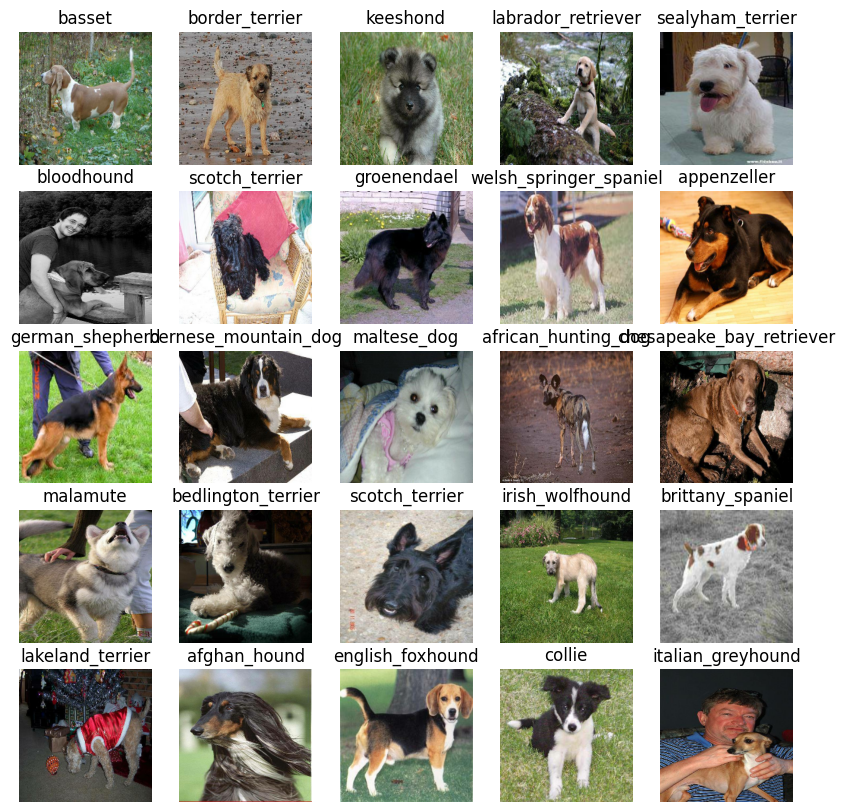

In [18]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_image(train_images, train_labels)


In [19]:
INUPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, wigth and color channels

OUTPUT_SHAPE = len(breeds)

MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/140-224-classification/versions/2"

In [20]:
def create_model(input_sahpe = INUPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url = MODEL_URL):
    print("building model with:", MODEL_URL)

    model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL),
                                tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                                                      activation='softmax')])
    model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                  optimizer= tf.keras.optimizers.Adam(),
                  metrics=['accuracy'])

    model.build(INUPUT_SHAPE)

    return model

model = create_model()

model.summary()

building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/140-224-classification/versions/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              6158505   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 6278745 (23.95 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 6158505 (23.49 MB)
_________________________________________________________________


#Creating Callbacks

In [21]:
#Load TensorBoard notebook extension
%load_ext tensorboard

In [22]:
def create_tensorboard_callback():
    logdir = os.path.join('drive/MyDrive/Colab Notebooks/logs', datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

    return tf.keras.callbacks.TensorBoard(logdir)

In [23]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                              patience= 3)

In [24]:
NUM_EPOCH = 100 #@param {type: "slider", min: 10, max: 100}

In [25]:
print("GPU", "Available" if tf.config.list_physical_devices("GPU") else "Not available")

GPU Available


#Train the model

In [26]:
def train_model():
    model = create_model()

    tensorboard = create_tensorboard_callback()

    model.fit(x=train_data,
              epochs=NUM_EPOCH,
              validation_data= val_data,
              validation_freq=1,
              callbacks=[tensorboard, early_stop])
    return model

model = train_model()

building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/140-224-classification/versions/2
Epoch 1/100
25/25 [==============================] - 15s 119ms/step - loss: 4.5003 - accuracy: 0.0838 - val_loss: 3.3451 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 2s 65ms/step - loss: 1.6221 - accuracy: 0.6925 - val_loss: 2.1314 - val_accuracy: 0.5400
Epoch 3/100
25/25 [==============================] - 2s 78ms/step - loss: 0.5658 - accuracy: 0.9438 - val_loss: 1.6816 - val_accuracy: 0.6350
Epoch 4/100
25/25 [==============================] - 2s 68ms/step - loss: 0.2444 - accuracy: 0.9937 - val_loss: 1.5037 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 2s 98ms/step - loss: 0.1419 - accuracy: 0.9987 - val_loss: 1.4207 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 3s 104ms/step - loss: 0.0968 - accuracy: 1.0000 - val_loss: 1.3898 - val_accuracy: 0.6650
Epoch 

In [27]:
%tensorboard --logdir drive/MyDrive/Colab\ Notebooks/logs

<IPython.core.display.Javascript object>

In [28]:
prediction = model.predict(val_data, verbose=1)

7/7 [==============================] - 11s 85ms/step


In [29]:
index = 42
print(f"Max value (probability of prediction): {np.max(prediction[index])}")
print(f"Sum:{np.sum(prediction[index])}")
print(f"Max index: {np.argmax(prediction[index])}")
print(f"Prediction label: {breeds[np.argmax(prediction[index])]}")

Max value (probability of prediction): 0.4413684010505676
Sum:0.9999999403953552
Max index: 113
Prediction label: walker_hound


In [30]:
def get_prediction_label(prediction):
    return breeds[np.argmax(prediction)]

prediction_label = get_prediction_label(prediction[42])
prediction_label

'walker_hound'

In [35]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [43]:
def unbatchify(data):
    images = []
    labels = []

    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(breeds[np.argmax(label)])
    return images, labels

val_images, val_labels = unbatchify(val_data)

In [48]:
def plot_prediction(prediction, labels, images, n=1):
    pred_prob, true_label, image= prediction[n], labels[n], images[n]

    pred_label = get_prediction_label(pred_prob)

    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    plt.title("{} {:2.0f}% {}".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label))



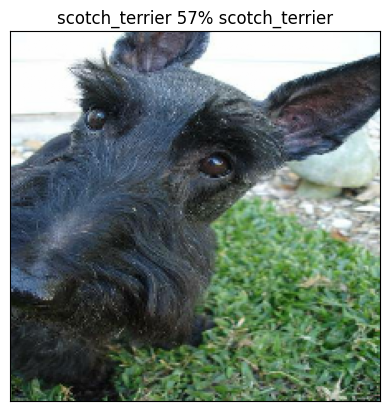

In [49]:
plot_prediction(prediction=prediction,
                labels=val_labels,
                images=val_images)

In [50]:
def plot_pred_conf(prediction, labels, n=1):
    pred_prob, true_label,= prediction[n], labels[n]

    pred_label = get_prediction_label(pred_prob)

    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    top_10_pred_values = pred_prob[top_10_pred_indexes]

    top_10_pred_labels = breeds[top_10_pred_indexes]

    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color='grey')

    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels = top_10_pred_labels,
               rotation='vertical')

    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass

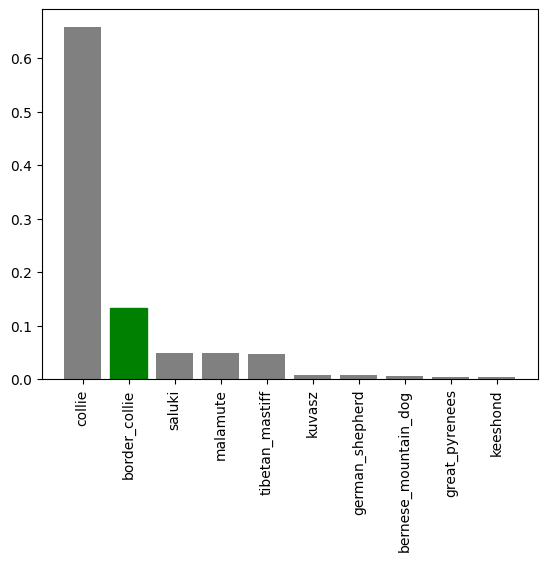

In [52]:
plot_pred_conf(prediction=prediction, labels= val_labels, n=9)

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 10*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_prediction(prediction=prediction,
                  labels=val_labels,
                  images=val_images,
                  n= i+i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction=prediction,
                 labels=val_labels,
                 n= i+i_multiplier)

  plt.tight_layout(h_pad=1.0)
plt.show()

In [66]:
def save_model(model, suffix=None):
    modeldir = os.path.join("drive/MyDrive/Colab Notebooks/models",
                            datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
                            )
    model_path = modeldir + "-" + suffix + "h5"
    print(f"Saving model to: {model_path}...")
    model.save(model_path)
    return model_path

In [71]:
def load_model(model_path):
    """
    Load a saved model from a specified path
    """
    print(f"Loading saved model")
    model = tf.keras.models.load_model(model_path,
                                       custom_objects={"KerasLayers": hub.KerasLayer})

    return model

In [69]:
save_model(model, suffix="1000 images training mobilenetv2-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/models/20231225-183722-1000 images training mobilenetv2-Adamh5...


'drive/MyDrive/Colab Notebooks/models/20231225-183722-1000 images training mobilenetv2-Adamh5'

In [72]:
loaded_model = load_model('drive/MyDrive/Colab Notebooks/models/20231225-183722-1000 images training mobilenetv2-Adamh5')

Loading saved model


In [73]:
loaded_model.evaluate(val_data)

7/7 [==============================] - 1s 63ms/step - loss: 1.2954 - accuracy: 0.6750


[1.2954014539718628, 0.675000011920929]

In [74]:
model.evaluate(val_data)

7/7 [==============================] - 1s 85ms/step - loss: 1.2954 - accuracy: 0.6750


[1.2954014539718628, 0.675000011920929]

#Training on all images:

In [75]:
full_data = create_data_batches(X,y)
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [76]:
full_model = create_model()

building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/140-224-classification/versions/2


In [77]:
full_model_tensorboard = create_tensorboard_callback()

In [78]:
full_model_early_stop = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                         patience=3)

In [79]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCH,
               callbacks=[full_model_tensorboard, full_model_early_stop])

Epoch 1/100
320/320 [==============================] - 24s 62ms/step - loss: 1.3174 - accuracy: 0.6816
Epoch 2/100
320/320 [==============================] - 22s 68ms/step - loss: 0.3639 - accuracy: 0.8925
Epoch 3/100
320/320 [==============================] - 19s 60ms/step - loss: 0.2090 - accuracy: 0.9424
Epoch 4/100
320/320 [==============================] - 22s 67ms/step - loss: 0.1316 - accuracy: 0.9709
Epoch 5/100
320/320 [==============================] - 22s 67ms/step - loss: 0.0879 - accuracy: 0.9857
Epoch 6/100
320/320 [==============================] - 19s 59ms/step - loss: 0.0648 - accuracy: 0.9897
Epoch 7/100
320/320 [==============================] - 18s 57ms/step - loss: 0.0481 - accuracy: 0.9950
Epoch 8/100
320/320 [==============================] - 18s 57ms/step - loss: 0.0391 - accuracy: 0.9954
Epoch 9/100
320/320 [==============================] - 18s 57ms/step - loss: 0.0306 - accuracy: 0.9977
Epoch 10/100
320/320 [==============================] - 32s 99ms/step - l

In [80]:
save_model(full_model, suffix="40 000 images training mobilenetv2-Adam")

Saving model to: drive/MyDrive/Colab Notebooks/models/20231225-185537-40 000 images training mobilenetv2-Adamh5...


'drive/MyDrive/Colab Notebooks/models/20231225-185537-40 000 images training mobilenetv2-Adamh5'

In [82]:
loaded_full_model = load_model('drive/MyDrive/Colab Notebooks/models/20231225-185537-40 000 images training mobilenetv2-Adamh5')

Loading saved model


In [83]:
test_path = 'test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [84]:
test_filenames[:10]

['test/3a0c9b685e4b93e40c4f7e1dff3e2352.jpg',
 'test/22a524ec5efe207d70753917b48d50f6.jpg',
 'test/3df624b9038c1322cba1db52fa3547e2.jpg',
 'test/8789588381a7f1b3970d974c9013637e.jpg',
 'test/bf6271e6ee74ea64502dc3b6c3ca7121.jpg',
 'test/e411a1b3681604f6321af7cb8e8f2de7.jpg',
 'test/90a3e77e8802823f857c32d281f3397b.jpg',
 'test/92e9917a19f9a606cc786cfb31677c9a.jpg',
 'test/3236f7d9c22ba920be690180a0ed84bd.jpg',
 'test/69922e58dbe25660e65e1c924937d74d.jpg']

In [85]:
len(test_filenames)

10357

In [89]:
test_data = create_data_batches(test_filenames, is_test_data=True)

preparing test data


In [92]:
test_prediction = loaded_full_model.predict(test_data,
                                            verbose=1)

324/324 [==============================] - 21s 63ms/step


In [93]:
np.savetxt("preds_array.csv", test_prediction, delimiter=",")

In [94]:
#np.loadtxt("preds_array.csv", delimiter=",")

In [96]:
test_prediction.shape

(10357, 120)

#Preparing prediction for kaggle

In [97]:
pred_df = pd.DataFrame(columns=["id"]+list(breeds))
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [100]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
pred_df["id"] = test_ids

In [101]:
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,3a0c9b685e4b93e40c4f7e1dff3e2352,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,22a524ec5efe207d70753917b48d50f6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3df624b9038c1322cba1db52fa3547e2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,8789588381a7f1b3970d974c9013637e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,bf6271e6ee74ea64502dc3b6c3ca7121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [103]:
pred_df[list(breeds)] = test_prediction
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,3a0c9b685e4b93e40c4f7e1dff3e2352,6.591767e-09,4.881805e-09,6.323320e-10,1.734872e-11,1.916917e-05,7.561225e-07,5.816287e-07,4.918490e-05,4.702207e-07,...,2.710998e-10,4.851942e-09,2.279562e-09,4.215572e-08,1.114995e-08,1.468420e-06,1.458858e-07,3.203779e-08,1.378638e-08,1.729927e-10
1,22a524ec5efe207d70753917b48d50f6,6.898072e-07,5.408743e-11,1.864890e-09,9.764647e-11,3.064359e-11,7.956023e-10,6.278328e-09,4.914074e-12,5.647747e-10,...,7.506601e-08,4.085316e-07,6.162724e-08,9.347328e-10,1.793692e-11,1.976590e-11,5.402635e-09,3.078969e-12,2.122365e-07,2.521265e-07
2,3df624b9038c1322cba1db52fa3547e2,1.598423e-09,3.198611e-09,2.927417e-09,4.953938e-08,1.240980e-08,3.878813e-08,1.783051e-02,1.471399e-06,6.270127e-10,...,7.405094e-08,3.179932e-06,1.050199e-09,2.086331e-10,1.457721e-08,2.299962e-08,7.625743e-08,4.627760e-09,1.250260e-08,8.300845e-04
3,8789588381a7f1b3970d974c9013637e,6.431280e-14,5.656760e-10,3.697489e-13,3.152860e-10,5.962274e-14,2.814635e-13,2.072022e-15,1.759187e-14,2.290373e-06,...,5.001670e-14,4.794821e-16,1.850480e-12,1.225355e-09,3.802327e-14,1.437702e-11,1.428518e-15,3.904071e-12,2.327279e-14,1.725860e-13
4,bf6271e6ee74ea64502dc3b6c3ca7121,1.909136e-08,1.665012e-09,3.992322e-12,1.524664e-08,8.634919e-14,5.172819e-08,2.028669e-09,1.197462e-09,1.370866e-09,...,2.269089e-08,3.983016e-10,6.286752e-11,1.502498e-09,5.318710e-08,1.153969e-10,8.547948e-08,2.545306e-07,8.893310e-08,2.901605e-08


In [104]:
pred_df.to_csv("final_Dog_Prediction.csv", index=False)